## Code for edge evidence fusion in polsar images##

### load required libraries ###

In [16]:
## Import all required libraries 
import numpy as np
## Used to present the images
import matplotlib as mpl
import matplotlib.pyplot as plt
## and the polsar libraries

import polsar_basics as pb
import polsar_fusion as pf
import polsar_evidence_avg as pea

### Function to read the selected data ###

In [17]:
## This function defines the source image and all the dat related to the region where we want
## to find borders
## Defines the ROI center and the ROI boundaries. The ROI is always a quadrilateral defined from the top left corner
## in a clockwise direction. 

def select_data():
    print("Select the image to be processed:")
    print("1.Flevoland - area 1")
    print("2.San Francisco")
    opcao=int(input("type the option:"))
    if opcao==1:
        print("Computing Flevoland area - region 1")
        ## Flevoland image
        imagem="./Data/AirSAR_Flevoland_Enxuto.mat"
        ## values adjusted visually - it needs to be defined more preciselly
        ## delta values from the image center to the ROI center
        dx=278 
        dy=70
        ## ROI coordinates
        x1 = 157;
        y1 = 284;
        x2 = 309;
        y2 = 281;
        x3 = 310;
        y3 = 327;
        x4 = 157;
        y4 = 330;
        ## inicial angle to start generating the radius
        alpha_i=0.0
        ## final angle to start generating the radius
        alpha_f=2*np.pi
    else:
        print("Computing San Francisco Bay area - region 1")
        ## San Francisco Bay image
        imagem="./Data/SanFrancisco_Bay.mat"
        ## values adjusted visually - it needs to be defined more preciselly
        ## delta values from the image center to the ROI center
        dx=50
        dy=-195
        ## ROI coordinates
        x1 = 180;
        y1 = 362;
        x2 = 244;
        y2 = 354;
        x3 = 250;
        y3 = 420;
        x4 = 188;
        y4 = 427;
        ## inicial angle to start generating the radius
        alpha_i=0.0
        ## final angle to start generating the radius
        alpha_f=np.pi/2
   
    ## Radius length
    RAIO=120
    ## Number of radius used to find evidence considering a whole circunference
    NUM_RAIOS=100
    
    ## adjust the number of radius based on the angle defined above
    if (alpha_f-alpha_i)!=(2*np.pi):
        NUM_RAIOS=int(NUM_RAIOS*(alpha_f-alpha_i)/(2*np.pi))
    gt_coords=[[x1, y1], [x2, y2], [x3, y3], [x4, y4]]
    
    return imagem, dx, dy, RAIO, NUM_RAIOS, alpha_i, alpha_f, gt_coords

## The cell below works as a main program and calls the functions in the libraries loaded above ##

Select the image to be processed:
1.Flevoland - area 1
2.San Francisco
type the option:2
Computing San Francisco Bay area - region 1
Computing evidence - this might take a while
Evidence added
Start to compute fusion
finding fusion using mean
finding fusion using PCS
finding fusion using ROC
finding fusion using SVD


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


finding fusion using SWT
finding fusion using DWT
Fusion done
ground truth computed
about to drw image plus evidence


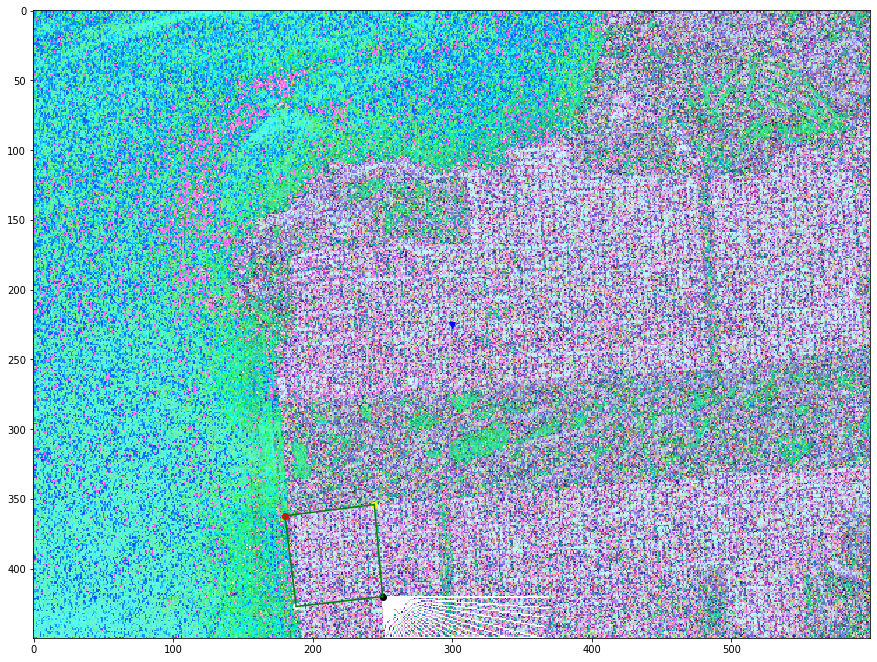

In [18]:
## Select the data to be processed
imagem, dx, dy, RAIO, NUM_RAIOS, alpha_i, alpha_f, gt_coords = select_data()

## Read the image
img, nrows, ncols, ncanal = pb.le_imagem(imagem)

## Sets the ratio between width and height of the image
img_rt=nrows/ncols

## Computes the Pauli decomposition of the POLSAR images
PI=pb.show_Pauli(img, 1, 0)

## Define the radials where evidence will be computed
x0, y0, xr, yr=pb.define_radiais(RAIO, NUM_RAIOS, dx, dy, nrows, ncols, alpha_i, alpha_f)

## draw the radials in the Pauli image
MXC, MYC, MY, IT, PI=pb.desenha_raios(ncols, nrows, ncanal, RAIO, NUM_RAIOS, img, PI, x0, y0, xr, yr)

## Finds evidence using BFGS
ncanal=3
evidencias=pea.find_evidence(RAIO, NUM_RAIOS, ncanal, MY)

## Put the evidences in an image
IM=pea.add_evidence(nrows, ncols, ncanal, evidencias, NUM_RAIOS, MXC, MYC)
print("Evidence added")
## Computes fusion using mean - metodo = 1
print("Start to compute fusion")
MEDIA=pf.fusao(IM, 1, NUM_RAIOS)

## Computes fusion using pca - metodo = 2
PCA=pf.fusao(IM, 2, NUM_RAIOS)

## Computes fusion using ROC - metodo = 3
ROC=pf.fusao(IM, 3, NUM_RAIOS)

## Testing fusion using SVD - metodo = 4
FI=pf.fusao(IM, 4, NUM_RAIOS)
SVD=FI

## Testing fusion using SWT - metodo = 5
FI=pf.fusao(IM, 5, NUM_RAIOS)
SWT=FI

## Testing fusion using DWT - metodo = 6
FI=pf.fusao(IM, 6, NUM_RAIOS)
DWT=FI
print("Fusion done")
## Define a variable to store the ground truth lines
GT = np.zeros([nrows, ncols])
print("ground truth computed")
## The lines vector defines the lines in the ROI where ground truth information will be generated. The lines are defined
## as follows:
## The first value corresponds to the line connecting the top left corner to the top right corner. If this value is 1 
## the ground truth data is computed. The second value corresponds to the next line in the quadrilateral in clockwise
## order
print('about to drw image plus evidence')
## Flevoland
lines=[1,1,1,1]
## San Francisco Bay
##lines=[1,0,0,1]

## Find the ground truth data based on the Bresenham algorithm - This needs a review.
gt_lines=pb.get_gt_lines(gt_coords, lines)

## Finds the extrem points of each line - this is done just to plot the lines using matplotlib 

gt_lines_coords=[]
i=0
for l in range(len(lines)):
    if lines[l]==1:
        x=gt_lines[i][0][0]
        y=gt_lines[i][1][0]
        i+=1
        gt_lines_coords.append([x,y])
            
## The prints below are just a check point - the values of the first print should be equal to the second print
## The third print shows the positions of the x and y from Bresenham for the ground truth lines.
##print(gt_lines_coords)
##print(gt_coords)
##print(gt_lines)

IMG=PI.copy()

plt.figure(figsize=(20*img_rt,20))
## Plots the image center point
plt.plot(ncols/2, nrows/2, marker='v', color="blue")
## Plot the points of the ROI 
plt.plot(gt_coords[0][0], gt_coords[0][1], marker='o', color="red")
plt.plot(gt_coords[1][0], gt_coords[1][1], marker='o', color="yellow")  
plt.plot(gt_coords[2][0], gt_coords[2][1], marker='o', color="black")
plt.plot(gt_coords[3][0], gt_coords[3][1], marker='o', color="white")  

## Shows the ground truth lines selected
i=0
for l in range(len(lines)):
    if lines[l]==1:
        x0=gt_lines_coords[i][0]
        y0=gt_lines_coords[i][1]
        x1=gt_lines[i][0][len(gt_lines[i][0])-1]
        y1=gt_lines[i][1][len(gt_lines[i][1])-1]
        i=i+1
        plt.plot([x0, x1], [y0, y1], color="green")
## shows the Pauli image
plt.imshow(IMG)
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


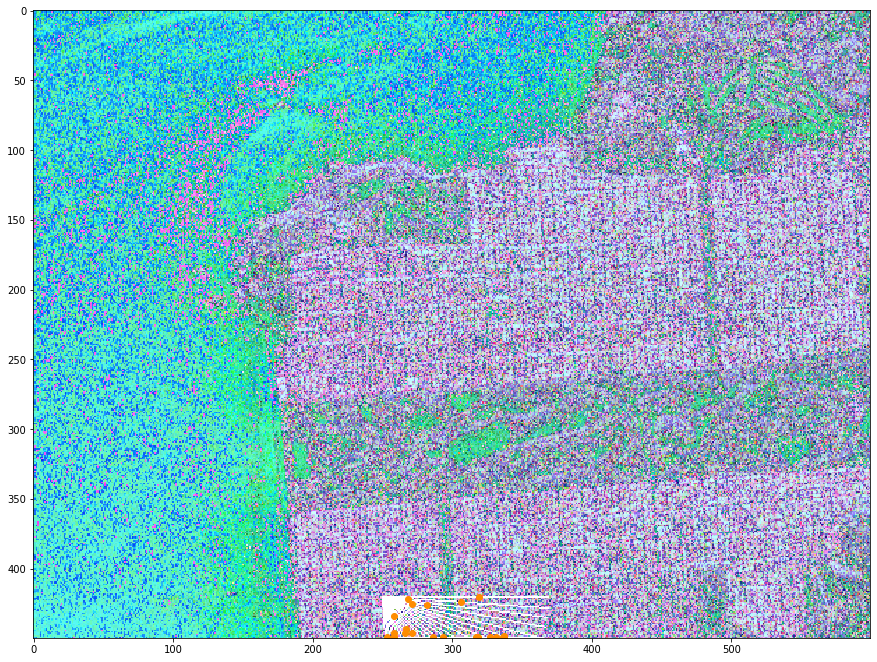

In [19]:
## Shows the evidence for the hh channel
pea.show_evidence(PI, NUM_RAIOS, MXC, MYC, img_rt, evidencias, 0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


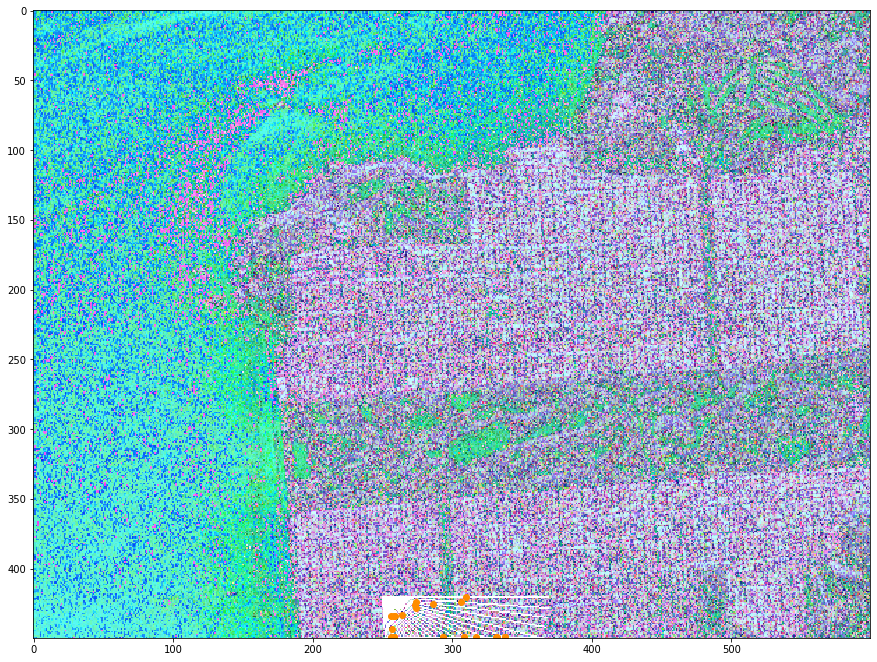

In [20]:
## Shows the evidence for the hv channel
pea.show_evidence(PI, NUM_RAIOS, MXC, MYC, img_rt, evidencias, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


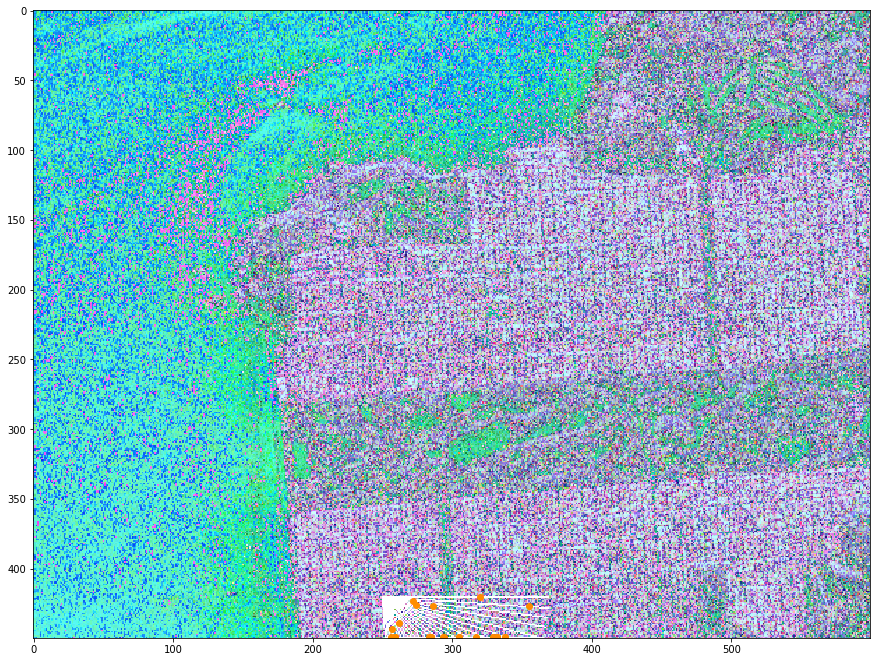

In [21]:
## Shows the evidence for the vv channel
pea.show_evidence(PI, NUM_RAIOS, MXC, MYC, img_rt, evidencias, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


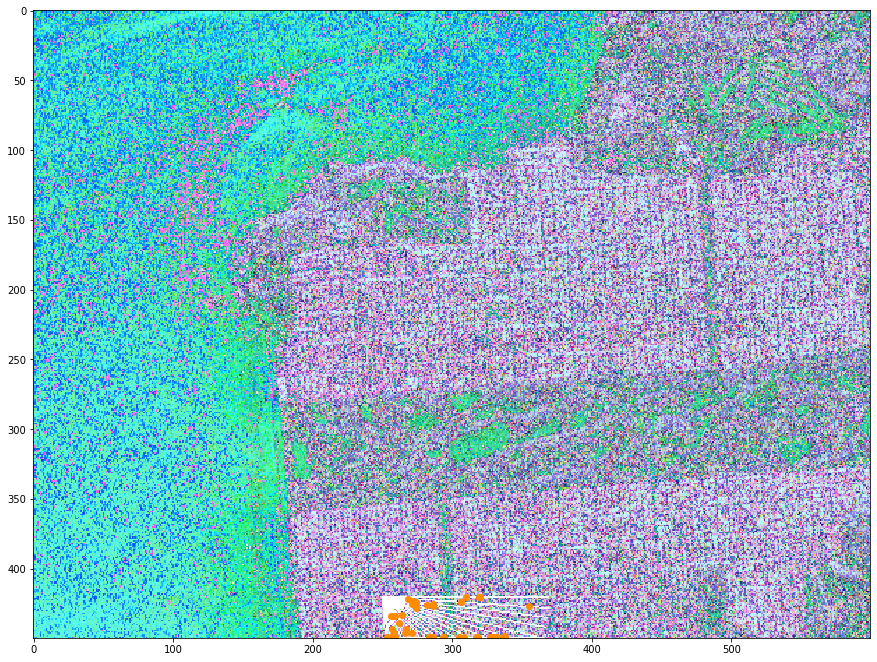

In [22]:
## Shows the mean fusion image
pf.show_fusion_evidence(PI, nrows, ncols, MEDIA, img_rt)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


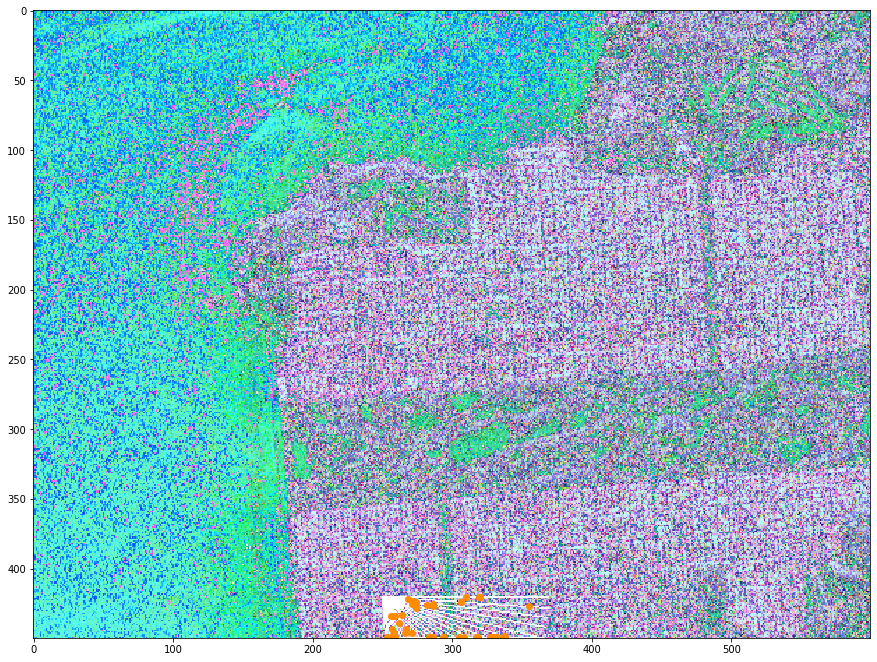

In [23]:
## Shows the PCA fusion image
pf.show_fusion_evidence(PI, nrows, ncols, PCA, img_rt)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


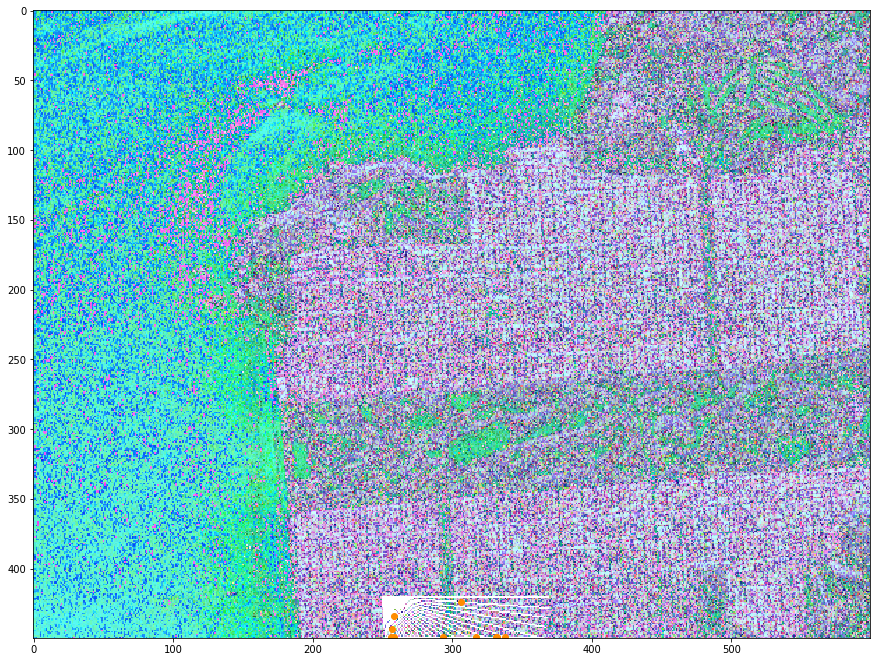

In [24]:
## Shows the ROC fusion image
pf.show_fusion_evidence(PI, nrows, ncols, ROC, img_rt)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


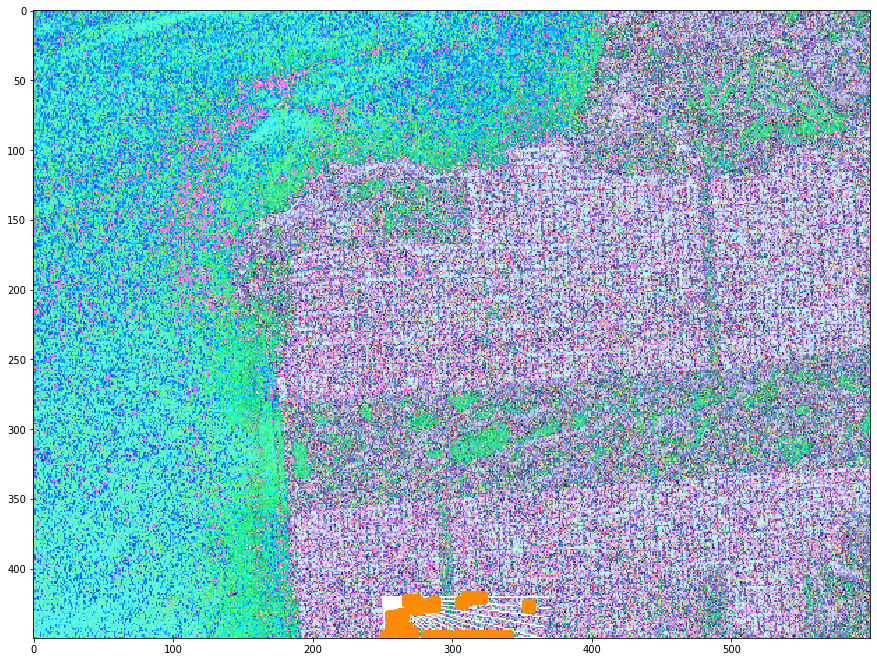

In [25]:
## Shows the DWT fusion image
pf.show_fusion_evidence(PI, nrows, ncols, DWT, img_rt)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


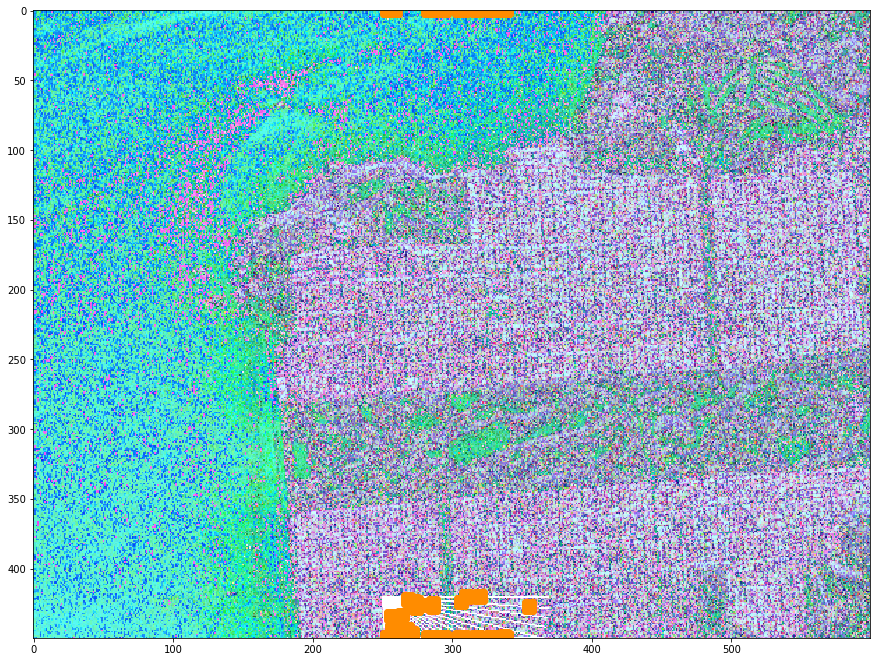

In [26]:
## Shows the SWT fusion image
pf.show_fusion_evidence(PI, nrows, ncols, SWT, img_rt)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


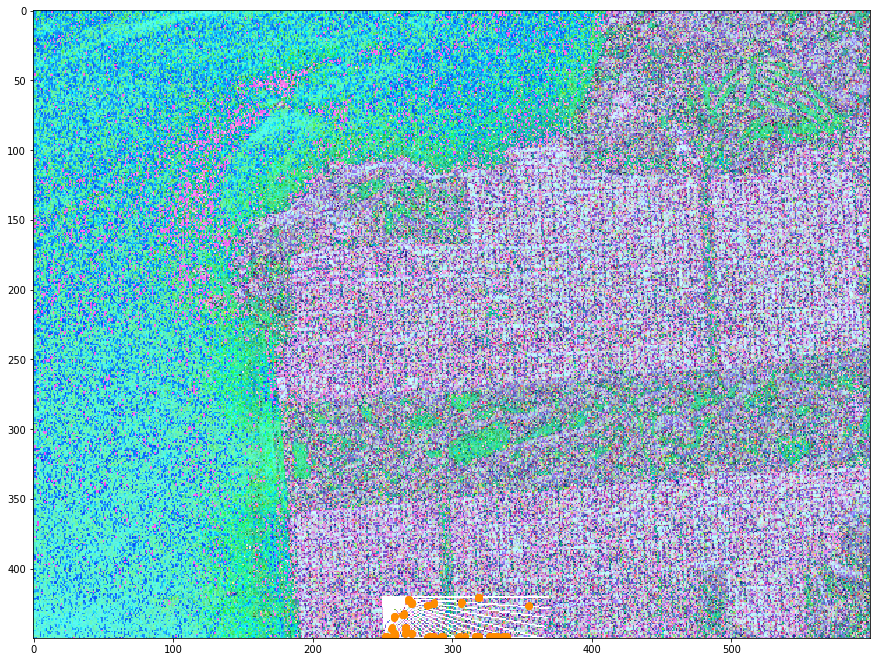

In [27]:
## Shows the SVD fusion image
pf.show_fusion_evidence(PI, nrows, ncols, SVD, img_rt)